<img src = 'https://github.com/insaid2018/Term-1/blob/master/Images/INSAID_Full%20Logo.png?raw=true' width="240" height="360">

# EDA on Facebook Data

<img src="https://github.com/pratik1malode/facebook-data-analysis/blob/master/facebook%20logo.png?raw=true" width="500" height="500">

## Table of Contents

1. [Problem Statement](#section1)<br>
2. [Importing Packages](#section2)<br>
3. [Loading Data](#section3)<br>
  - 3.1 [Description of the Datasets](#section301)<br>
  - 3.2 [Pandas Profiling before Data Preprocessing](#section302)<br>
4. [Data Preprocessing](#section4)<br>
  - 4.1 [Data Preprocessing](#section401)<br>
  - 4.2 [Pandas Profiling after Data Preprocessing](#section402)<br>
5. [Exploratory Data Analysis](#section5)<br>
  - 5.1 [**Analysis based on facebook metrics**](#section501)<br>
    - 5.1.1 [What percentage of facebook users are male and female?](#section50101)<br>
    - 5.1.2 [How is the age group distributed for male and female users?](#section50102)<br>
    - 5.1.3 [Is there a correlation between age, tenure, friend count, friendships initiated, likes and likes received?](#section50103)<br>
    - 5.1.4 [Is there a difference between likes posted and received for males and females?](#section50104)<br>
    - 5.1.5 [What is the mean and median friend count for males and females?](#section50105)<br>
  - 5.2 [**Analysis based on friendships**](#section502)<br>
      - 5.2.1 [Which gender initiates more friendships?](#section50201)<br>
      - 5.2.2 [Does age and gender impact the number of friendships?](#section50202)<br>
  - 5.3 [**Analysis based on likes data**](#section503)<br>
    - 5.3.1 [Which gender receives more likes?](#section50301)<br>
    - 5.3.2 [Which age group receives the highest likes?](#section50302)<br>
    - 5.3.3 [Which age group gives the most likes?](#section50303)<br>
  - 5.4 [**Analysis based on Web and Mobile medium**](#section504)<br>
    - 5.4.1 [Which is the medium of choice for using facebook?](#section50401)<br>
    - 5.4.2 [What is the average tenure based on age?](#section50402)<br>
  - 5.5 [**Comparitive analysis**](#section506)<br>
    - 5.5.1 [Comparison of data between males and females](#section50601)<br>
6. [Conclusion](#section6)
  - 6.1 [Actionable Insights](#section601)

<a id=section1></a>
## 1. Problem Statement

**Facebook** is an American social media and technology company based in Menlo Park, California. Facebook helps you connect and share with the people in your life. In 2020, the global number of Facebook users is expected to reach 1.69 billion, up from 1.34 million in 2014. With so many users using facebook and generating data, there are plenty of opportunities for facebook to analyze user data and process it into meaningful information and insights. These insights can further be utilized to take decisions and implement improvements to enhance user experience and propel Facebook's growth.

<img src = 'https://github.com/pratik1malode/facebook-data-analysis/blob/master/facebook%20theme.PNG?raw=True'>

---

<a id=section2></a>
## 2. Importing Packages

In [3]:
import numpy as np                     

import pandas as pd
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', None)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()

import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

### Disclaimer: The images are only for illustration purpose. Please don't compare them with the data.

<a id=section3></a>
## 3. Loading Data

The raw data is a CSV file which contains information about **Facebook users** and **social media activities** related to them.

### Importing Dataset

In [5]:
# Importing the dataset (Facebook dataset)

df_fb = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/facebook_data.csv', na_values = 'NaN')
df_fb.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


<a id=section301></a>
### Description of the Dataset

- This dataset provides a **user profile and behaviour analysis** of different users who have registered their profile on facebook, including user ID, age and date of birth, gender, tenure of user profile, friend count, frinedships initiated and 'like' count (number of likes given and number of likes received on web and mobile platform).


- Detailed information about each column can be found at this link https://www.facebook.com/help/1624177224568554/?helpref=hc_fnav


| Column Name                    | Description                                                                                |
| -------------------------------|:------------------------------------------------------------------------------------------:| 
| userid                         | The unique identification number of the user registered with facebook                      |  | age                            | Age of the facebook user                                                                   | 
| dob_day                        | Day of the month on which the user was born, as per facebook records                       | 
| dob_month                      | Month of the year on which the user was born, as per facebook records                      | 
| dob_year                       | Year on which the user was born, as per facebook records                                   |
| tenure                         | Duration in days for which the user profile exists on facebook since the date of user      |                                    creating his/her profile                                                                   |
| friend_count                   | Total number of friends connected with the user on facebook                                |
| friendships_initiated          | Count of friend requests triggered by the user                                             |
| likes                          | Count of posts and pages liked by the user                                                 |
| likes_received                 | Total number of likes received on content posted by the user                               |
| mobile_likes                   | Number of likes submitted by the user on facebook mobile version                           |
| mobile_likes_received          | Number of likes received on the user's profile through facebook mobile version             |
| www_likes                      | Number of likes submitted by the user through facebook web version                         |
| www_likes_received             | Number of likes received on the user's profile through facebook web version                |


<img src="https://github.com/pratik1malode/facebook-data-analysis/blob/master/home%20page.jpg?raw=True" width=750 height=750><br/>

In [5]:
df_fb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99003 entries, 0 to 99002
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   userid                 99003 non-null  int64  
 1   age                    99003 non-null  int64  
 2   dob_day                99003 non-null  int64  
 3   dob_year               99003 non-null  int64  
 4   dob_month              99003 non-null  int64  
 5   gender                 98828 non-null  object 
 6   tenure                 99001 non-null  float64
 7   friend_count           99003 non-null  int64  
 8   friendships_initiated  99003 non-null  int64  
 9   likes                  99003 non-null  int64  
 10  likes_received         99003 non-null  int64  
 11  mobile_likes           99003 non-null  int64  
 12  mobile_likes_received  99003 non-null  int64  
 13  www_likes              99003 non-null  int64  
 14  www_likes_received     99003 non-null  int64  
dtypes:

- ```info``` function gives us the following insights into the df_fb dataframe:

  - There are a total of **99003 samples (rows)** and **15 columns** in the dataframe.
  
  - There are **14 columns** with a **numeric** datatype and **1 column** with an **object** datatype.
  
  - There are **177 missing** values in the data (175 in gender and 2 in tenure). The **missing values** represent **<1% of         total data**

In [6]:
df_fb.describe()

,userid,age,dob_day,dob_year,dob_month,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
count,9.900300e+04,99003.000000,99003.000000,99003.000000,99003.000000,99001.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000
mean,1.597045e+06,37.280224,14.530408,1975.719776,6.283365,537.887375,196.350787,107.452471,156.078785,142.689363,106.116300,84.120491,49.962425,58.568831
std,3.440592e+05,22.589748,9.015606,22.589748,3.529672,457.649874,387.304229,188.786951,572.280681,1387.919613,445.252985,839.889444,285.560152,601.416348
min,1.000008e+06,13.000000,1.000000,1900.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.298806e+06,20.000000,7.000000,1963.000000,3.000000,226.000000,31.000000,17.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.596148e+06,28.000000,14.000000,1985.000000,6.000000,412.000000,82.000000,46.000000,11.000000,8.000000,4.000000,4.000000,0.000000,2.000000
75%,1.895744e+06,50.000000,22.000000,1993.000000,9.000000,675.000000,206.000000,117.000000,81.000000,59.000000,46.000000,33.000000,7.000000,20.000000
max,2.193542e+06,113.000000,31.000000,2000.000000,12.000000,3139.000000,4923.000000,4144.000000,25111.000000,261197.000000,25111.000000,138561.000000,14865.000000,129953.000000


- ```describe``` function gives us the following insights into the data:
  
  - **Age** column has a **positive (right) skewed distribution** because the **mean (37.28)** value lies to the **right** of the **median (28)** value. **50%** of facebook users are aged **<= 28 years** and **75%** of facebook users are aged **<= 50 years**. **25%** of facebook users are aged between **50 to 113 years**. Moreover, **Age** has a **high standard deviation (22)** implying that a facebook has users across **varied age groups**

  - The distribution of **tenure** is **positive (right) skewed** because the **mean** of **tenure (537.8)** lies to the **right** of the **median(50%)** value **(412)**, on a **distribution plot**. 
  
  - The **max** value of **tenure (3139)** is an **outlier** because it lies far away from the mean.
      
  - **friend_count** column has a **positive (right) skewed distribution** because the **mean (196.35)** value lies to the **right** of the **median (82)** value. **50%** of facebook users have upto **82** friends and **75%** of facebook users have upto **206** friends.
  
    
   - Similarly comparing the **75%** and **max** values of the other columns we can see that there are **outliers** present in friend count, friendships_initiated, likes & likes received columns.

<a id=section302></a>
### 3.2 Pandas Profiling before Data Preprocessing

- Here, we will perform **Pandas Profiling before preprocessing** our dataset, so we will name the **output file** as __profiling_before_preprocessing.html__. 


- The file will be stored in the directory of your notebook. Open it using the jupyter notebook file explorer and take a look at it and see what insights you can develop from it. 


- Or you can **output the profiling report** in the **current jupyter notebook** as well as shown in the code below. 

In [8]:
# To install pandas profiling please run this command.

!pip install pandas-profiling --upgrade

Requirement already up-to-date: pandas-profiling in c:\anaconda\lib\site-packages (2.6.0)


In [12]:
import pandas_profiling 

In [ ]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_before_preprocessing.html

profile = df_fb.profile_report()
profile.to_file(output_file="Facebook data profiling_before_preprocessing.html")

# To output the pandas profiling report on the notebook.

df_fb.profile_report(title='Facebook data profiling_before_preprocessing')

**Observations from Pandas Profiling before Data Processing** <br><br>
__Dataset info__:
- Number of variables: 15
- Number of observations: 99003
- Missing cells: 177 (<1%)


__Variables types__: 
- Numeric = 14
- Categorical = 1


<br>

- **userid** is **100% unique** with **no missing values**.


- **gender** has **175 (0.2%) missing values**.


- **tenure** has **2 (<0.1%) missing values**

<br>

- below columns have a **high cardinality:**
    
    - **tenure (2426 distinct values)**
    - **age (101 distinct values)**
    - **dob_year (101 distinct values)**
    - **friend_count (2562 distinct values)**
    - **friendships_initiated (1519 distinct values)**
    - **likes (2924 distinct values)**
    - **likes_received (2681 distinct values)**
    - **mobile_likes (2396 distinct values)**
    - **mobile_likes_received (2004 distinct values)**
    - **www_likes (1726 distinct values)**
    - **www_likes_received (1636 distinct values)**
    
<br>      

- below columns have **high % of zeroes:**

    - **likes** has **22308 (22.5%)** zeroes
    - **likes_received** has **24428 (24.7%)** zeros
    - **mobile_likes** has **35056 (35.4%)** zeros
    - **mobile_likes_received** has **30003 (30.3%)** zeros
    - **www_likes** has **60999 (61.6%)** zeros
    - **www_likes_received** has **36864 (37.2%)** zeros
    
<br>

- **age** and **dob_year** are **highly correlated**

  
- **age** has a **skewness** of **1.42** and **kurtosis** of **1.56**.

  
- **dob_year** has data divided into **101** distinct values.
  
    
- **gender** has data divided into **2** distinct values.
  
  - **male** has **58574** samples **(59.2% share)** and **female** has **40254** samples **(40.7% share)**.
  
 
- **tenure** has a **skewness** of **1.53** and **kurtosis** of **2.19**.

  - **Maximum value = 3139** is an **outlier**, as it lies far away from the **Q3 (75th percentile)** value **(675)**.
  
  
- **friend_count** has a **skewness** of **6.06** and **kurtosis** of **50.09**.

  - **Maximum value = 4923** is an **outlier**, as it lies far away from the **Q3 (75th percentile)** value **(675)**.
 
  
- All the **remaining columns** can be studied in the same way.

<a id=section4></a>
## 4. Data Preprocessing

<a id=section401></a>
### 4.1 Data Preprocessing

- Here we will perform **Data Preprocessing** on our dataset, to make the data usable for **EDA**.


- In order to avoid any errors, please run **Pandas Profiling** before running the code below.

In [7]:
df_fb.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


- The columns **userid, dob_day, dob_month and dob_year** will be **dropped** because they **don't provide** any additional **insights** into the data. Also, dob_year has a high correlation with age column

In [6]:
df_fb.drop(['userid','dob_day','dob_month','dob_year'], 1, inplace=True)

In [7]:
df_fb.head()

,age,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,14,male,266.0,0,0,0,0,0,0,0,0
1,14,female,6.0,0,0,0,0,0,0,0,0
2,14,male,13.0,0,0,0,0,0,0,0,0
3,14,female,93.0,0,0,0,0,0,0,0,0
4,14,male,82.0,0,0,0,0,0,0,0,0


In [7]:
# Replacing NaN values in tenure with median

df_fb['tenure'].median()

df_fb['tenure'].fillna(412, inplace = True)

df_fb.isnull().sum().sum()

175

- **gender** column has **175 missing values** present, as the gender can either be male or female, it does not make sense to replace these missing categorical values which are < 1% of the total data. Hence we will delete the rows with missing gender

In [8]:
# Dropping rows with missing gender data

df_fb.dropna(subset = ['gender'], inplace = True)

df_fb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98828 entries, 0 to 99002
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   age                    98828 non-null  int64  
 1   gender                 98828 non-null  object 
 2   tenure                 98828 non-null  float64
 3   friend_count           98828 non-null  int64  
 4   friendships_initiated  98828 non-null  int64  
 5   likes                  98828 non-null  int64  
 6   likes_received         98828 non-null  int64  
 7   mobile_likes           98828 non-null  int64  
 8   mobile_likes_received  98828 non-null  int64  
 9   www_likes              98828 non-null  int64  
 10  www_likes_received     98828 non-null  int64  
dtypes: float64(1), int64(9), object(1)
memory usage: 9.0+ MB


- The **tenure** column has values in **decimals**, which is can be converted to **integer** without affecting the accuracy and integrity of the data

In [9]:
# Converting float to int

df_fb['tenure'] = df_fb['tenure'].astype('int64')

df_fb.info()

df_fb.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98828 entries, 0 to 99002
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   age                    98828 non-null  int64 
 1   gender                 98828 non-null  object
 2   tenure                 98828 non-null  int64 
 3   friend_count           98828 non-null  int64 
 4   friendships_initiated  98828 non-null  int64 
 5   likes                  98828 non-null  int64 
 6   likes_received         98828 non-null  int64 
 7   mobile_likes           98828 non-null  int64 
 8   mobile_likes_received  98828 non-null  int64 
 9   www_likes              98828 non-null  int64 
 10  www_likes_received     98828 non-null  int64 
dtypes: int64(10), object(1)
memory usage: 9.0+ MB


,age,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,14,male,266,0,0,0,0,0,0,0,0
1,14,female,6,0,0,0,0,0,0,0,0
2,14,male,13,0,0,0,0,0,0,0,0
3,14,female,93,0,0,0,0,0,0,0,0
4,14,male,82,0,0,0,0,0,0,0,0


<a id=section402></a>
### 4.2 Pandas Profiling after Data Preprocessing

- Here, we will perform **Pandas Profiling after preprocessing** our dataset, so we will name the **output file** as __profiling_after_preprocessing.html__.

In [13]:
# To output pandas profiling report to an external html file.
# Saving the output as profiling_after_preprocessing.html

profile = df_fb.profile_report()
profile.to_file(output_file="profiling_after_preprocessing.html")

# To output the pandas profiling report on the notebook.

df_fb.profile_report(title='Pandas Profiling after Data Preprocessing')

**Observations from Pandas Profiling after Data Processing** <br><br>
__Dataset info__:
- Number of variables: 12
- Number of observations: 98828
- Missing cells: 0 (0.0%)


__Variables types__: 
- Numeric = 11
- Categorical = 1

<br>

<a id=section5></a>
## 5. Exploratory Data Analysis

**Exploratory Data Analysis(EDA)** is an **approach to analyzing data sets** to **summarize** their **main characteristics**, often with **visual methods**. 


- It includes **cleaning, munging, combining, reshaping, slicing, dicing, and transforming data** for **analysis** purpose.


- The **primary goal of EDA** is to **maximize the analyst's insight into a data set** and into the **underlying structure of a data set**, while **providing all of the specific items** that an **analyst would want to extract from a data set**, such as:
 <br><br> 
  - A list of **outliers**.<br><br>
  
  - A **good-fitting model**.  <br><br>
  
  - **Estimates for parameters**.<br><br>
  
  - **Uncertainties** for those **estimates**.<br><br>
  
  - A **ranked list** of **important factors**.<br><br>
  
  - **Conclusions** as to whether **individual factors are statistically significant**.<br><br>
  
  - A **sense of robustness of conclusions**.<br><br>
  
  - **Optimal settings**.<br><br>

<a id=section501></a>
## 5.1 Analysis Based on facebook Metrics

<a id=section50101></a>
### 5.1.1 What percentage of facebook users are male and female?

18.599999999999994

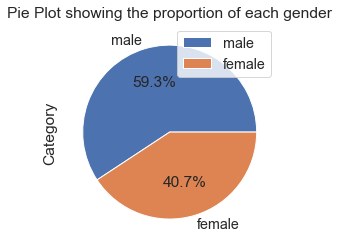

In [13]:
df_fb['gender'].value_counts().plot(kind = 'pie', autopct='%3.1f%%', legend = True)
plt.ylabel('Category')
plt.title('Pie Plot showing the proportion of each gender')
59.3-40.7

- **59.3%** of facebook users are **male** and **40.7%** are **female**.


- This implies that male users exceed female users by 18.6 percent

- Further analysis will done based on comparison of various parameters across male and female gender

<a id=section50102></a>
### 5.1.2 How is the age group distributed for male and female users?

In [10]:
df_fb['age_group'] = pd.cut(x = df_fb['age'], bins = [10,20,30,40,50,60,70,80,90,100,110,120], labels = ['<20','20-29','30-39','40-49','50-59','60-69','70-79','80-89','90-99','100-109','110+'],include_lowest=True)

Text(0.5, 1.0, 'Age Group vs Gender')

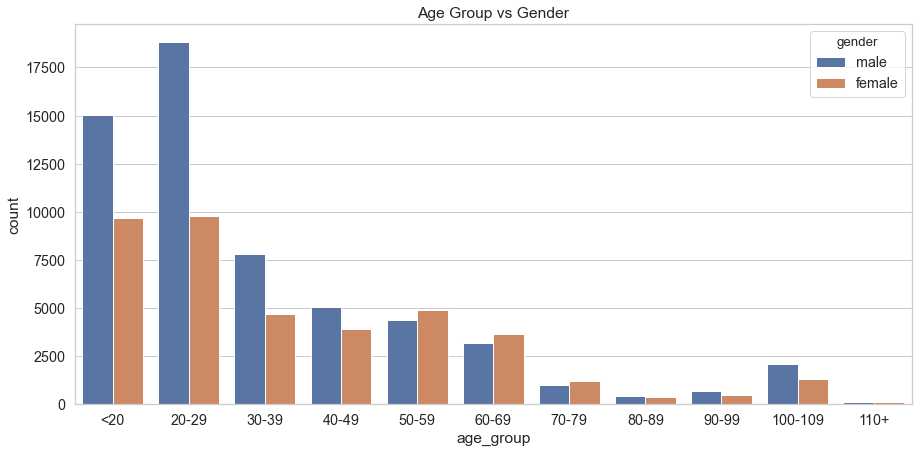

In [22]:
plt.figure(figsize=(15,7))
sns.countplot(data=df_fb,x='age_group',hue='gender')
plt.title('Age Group vs Gender')

-**Majority** of **male** facebook uers are aged between **20-29** years. **Majority** of **female** facebook users are **aged less than 20 years**.


- The number of **female** facebook users are **less than male users** for **all** age groups **except for 50-59 yrs, 60-69 years, and 70-79 years**

<a id=section50103></a>
### 5.1.3 Is there a correlation between age, tenure, friend count, friendships initiated, likes and likes received data?

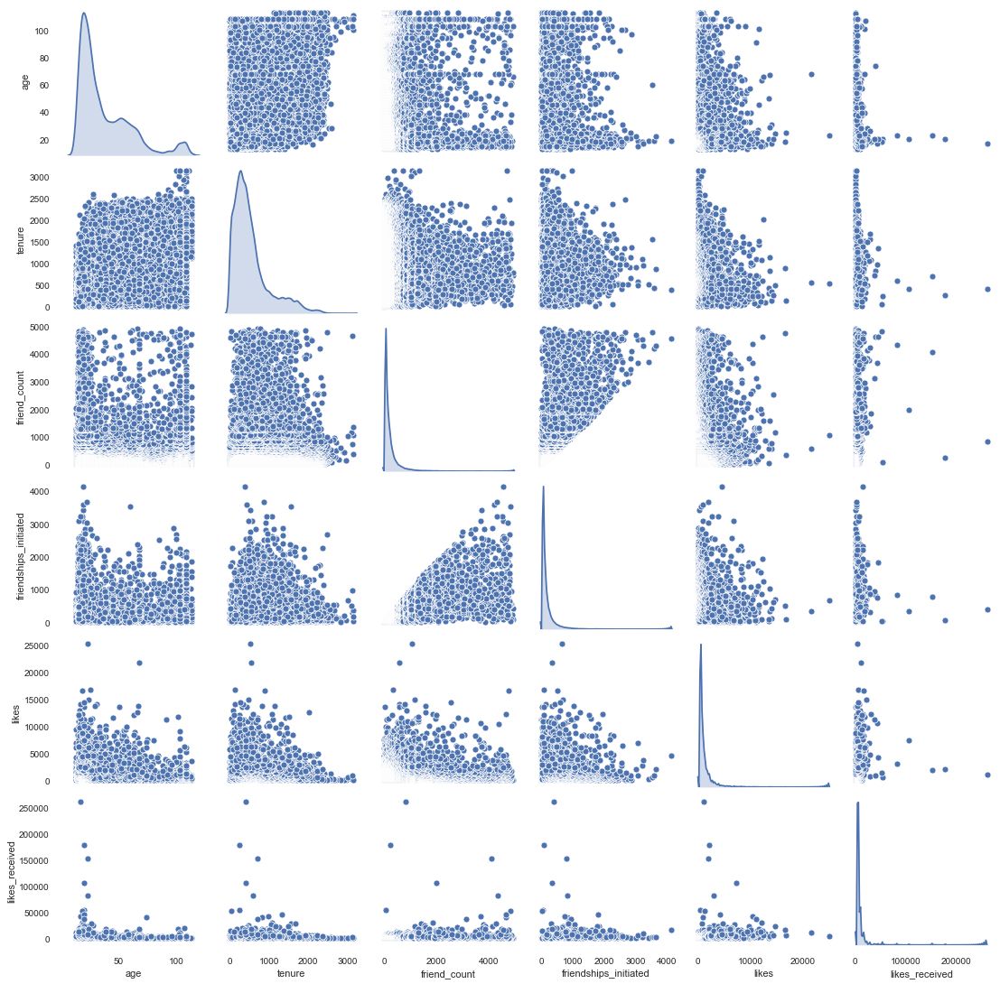

In [26]:
sns.pairplot(data=df_fb[['age','tenure','friend_count','friendships_initiated','likes','likes_received']],diag_kind='kde')

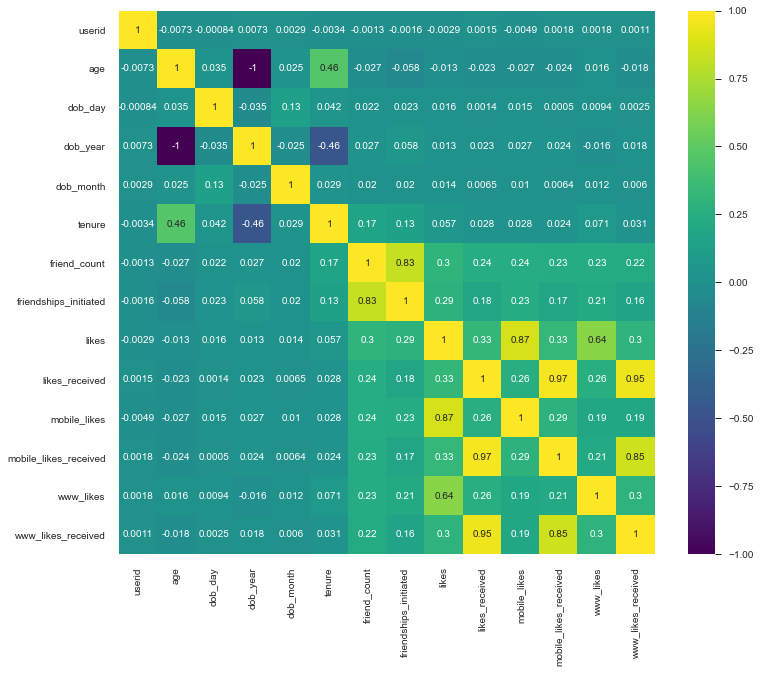

In [28]:
corr_mat = df_fb.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr_mat, annot=True, cmap='viridis')

- There is **correlation** between age & tenure (0.46), friend count & friendships initiated (0.83), likes & mobile_likes (0.87), likes & www_likes (0.64), likes_received & mobile_likes_received (0.97), likes_received & www_likes_received (0.95) received columns


- We will divide, analyze and compare the data between male and female genders to gain further insights



<a id=section50104></a>
### 5.1.4 Is there a difference between likes posted and received for males and females?

In [14]:
from pandas.plotting import parallel_coordinates

In [12]:
df_pc = df_fb.copy()
df_pc.head()

,age,dob_day,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received,age_group
0,14,19,11,male,266,0,0,0,0,0,0,0,0,<20
1,14,2,11,female,6,0,0,0,0,0,0,0,0,<20
2,14,16,11,male,13,0,0,0,0,0,0,0,0,<20
3,14,25,12,female,93,0,0,0,0,0,0,0,0,<20
4,14,4,12,male,82,0,0,0,0,0,0,0,0,<20


In [13]:
for colname in df_pc.columns:
    if colname not in ['dob_day', 'dob_month', 'gender', 'age_group']:
        df_pc[colname] = (df_pc[colname] - df_pc[colname].min()) / (df_pc[colname].max() - df_pc[colname].min())

In [34]:
df_pc.head()

,age,dob_day,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,0.01,19,11,male,0.084740,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.01,2,11,female,0.001911,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.01,16,11,male,0.004141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.01,25,12,female,0.029627,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.01,4,12,male,0.026123,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


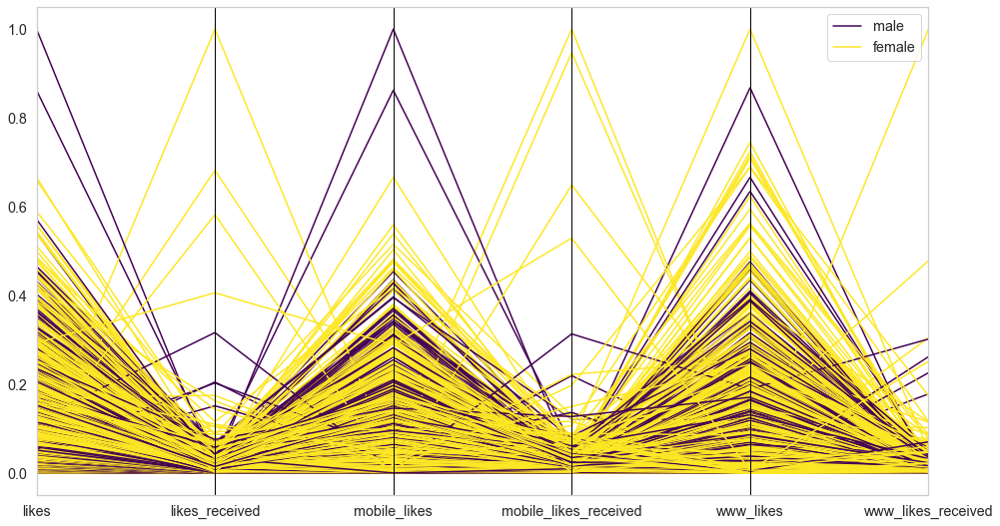

In [35]:
plt.figure(figsize=(16,9))
parallel_coordinates(df_pc,class_column='gender',colormap='viridis',cols=['likes','likes_received','mobile_likes','mobile_likes_received','www_likes','www_likes_received'])

- Though facebook has a significantly lesser number of female users, **females** tend to **receive more likes** from mobile and web medium **compared to males**.


- **Males post more likes from mobile compared to females**

<a id=section50105></a>
### 5.1.5 What is the mean and median friend count for males and females?

gender
female    9740258
male      9666787
Name: friend_count, dtype: int64

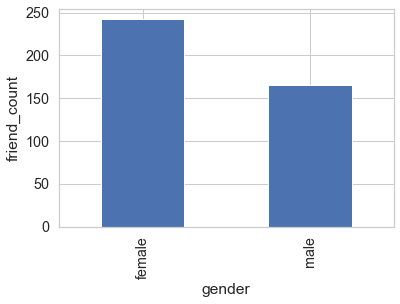

In [35]:
df_fb.groupby(['gender'])['friend_count'].mean().plot(kind='bar')
plt.xlabel('gender')
plt.ylabel('friend_count')
df_fb.groupby(['gender'])['friend_count'].sum()

Text(0, 0.5, 'friend_count')

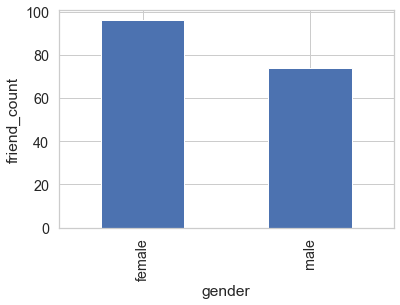

In [17]:
df_fb.groupby(['gender'])['friend_count'].median().plot(kind='bar')
plt.xlabel('gender')
plt.ylabel('friend_count')

- **On an average,  females** have **more** number of facebook **friends** than males.

<a id=section502></a>
## 5.2 Analysis Based on Friendships

<a id=section50201></a>
### 5.2.1 Which gender initiates more friendships?

gender
female    4584894
male      6037023
Name: friendships_initiated, dtype: int64

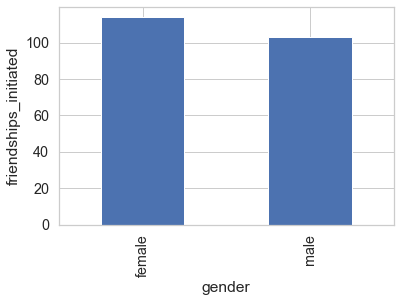

In [36]:
df_fb.groupby(['gender'])['friendships_initiated'].mean().plot(kind='bar')
plt.xlabel('gender')
plt.ylabel('friendships_initiated')
df_fb.groupby(['gender'])['friendships_initiated'].sum()

Text(0, 0.5, 'friendships_initiated')

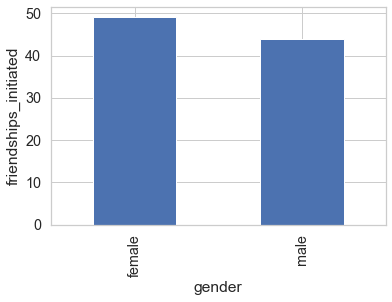

In [19]:
df_fb.groupby(['gender'])['friendships_initiated'].median().plot(kind='bar')
plt.xlabel('gender')
plt.ylabel('friendships_initiated')

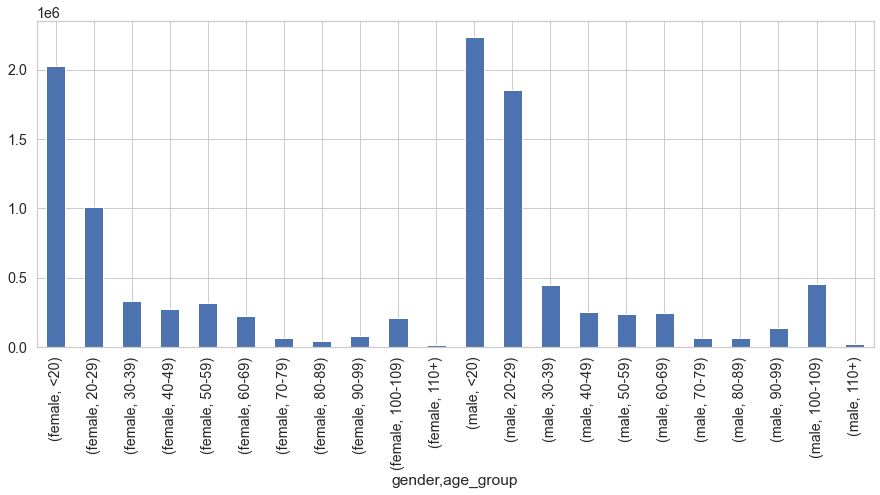

In [54]:
df_fb.groupby(['gender','age_group'])['friendships_initiated'].sum().plot(kind='bar',figsize=(15,6))

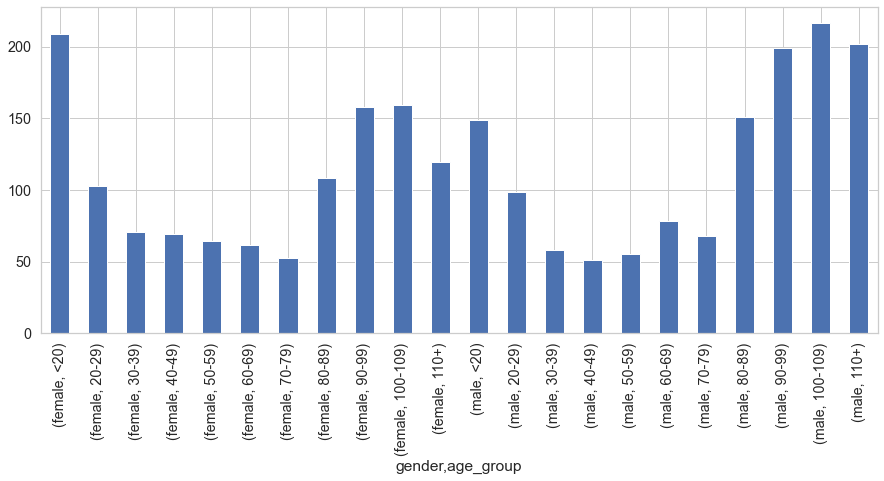

In [55]:
df_fb.groupby(['gender','age_group'])['friendships_initiated'].mean().plot(kind='bar',figsize=(15,6))

<Figure size 1080x504 with 0 Axes>

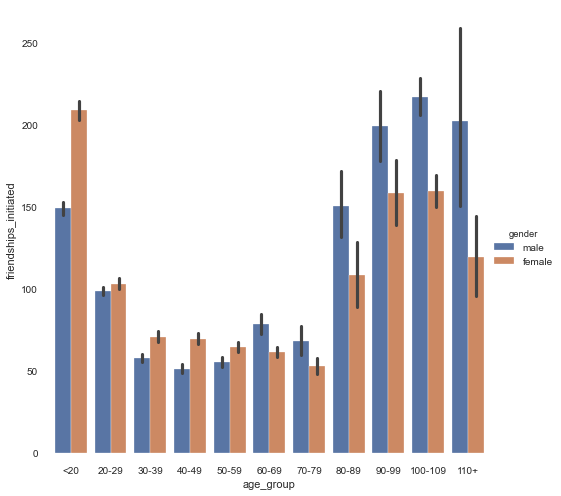

In [43]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='friendships_initiated', hue='gender', data=df_fb, height=7, kind='bar')

- On an **average, Females initiate more friendships than males**.

- On an average, females aged <20 initiate the most friendships followed by males in the 100+ agroup.

<a id=section50203></a>
### 5.2.2 Does age and gender impact the number of friendships?

<Figure size 1080x504 with 0 Axes>

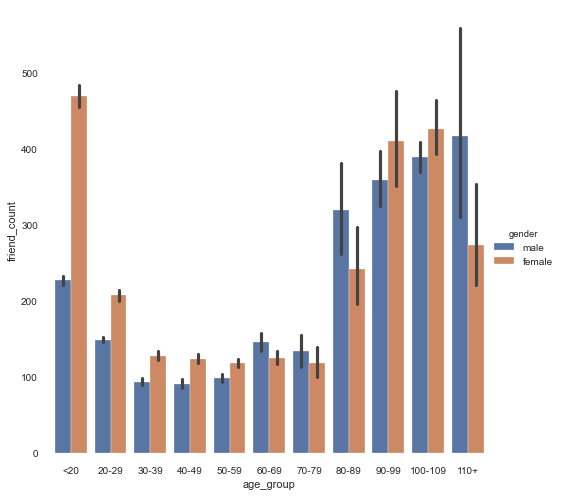

In [40]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='friend_count', hue='gender', data=df_fb, height=7, kind='bar')

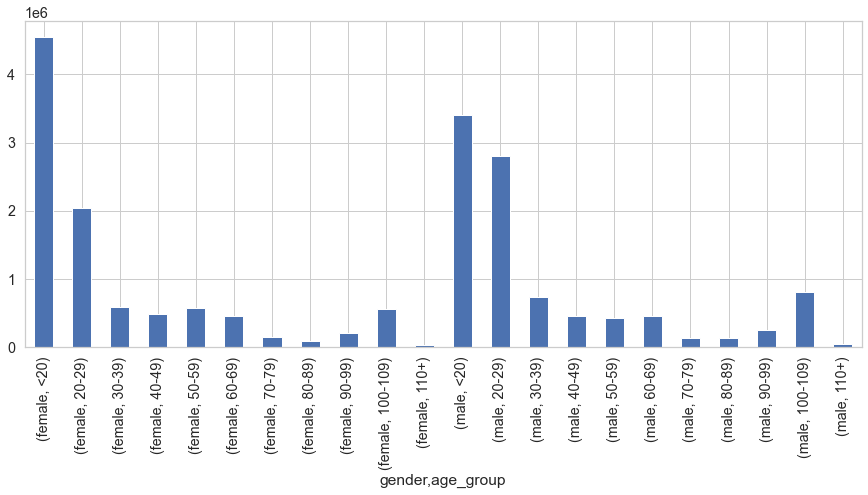

In [53]:
df_fb.groupby(['gender','age_group'])['friend_count'].sum().plot(kind='bar',figsize=(15,6))

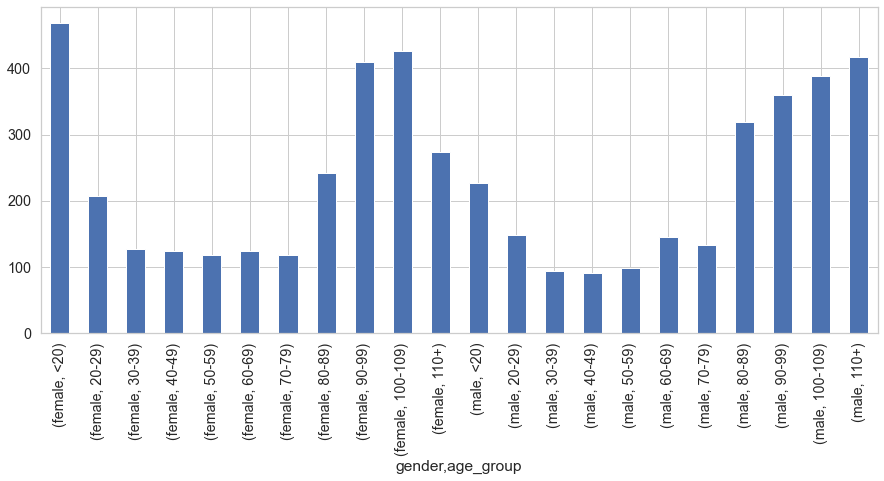

In [57]:
df_fb.groupby(['gender','age_group'])['friend_count'].mean().plot(kind='bar',figsize=(15,6))

- It is evident form the chart that **teenage females**  have **more facebook friends**.


- **Males and females aged 80 and above have more facebook friends than their younger generation on an average**.

<a id=section503></a>
## 5.3 Analysis Based on likes data

<a id=section50301></a>
### 5.3.1 Which gender receives more likes?

Text(0, 0.5, 'likes_received')

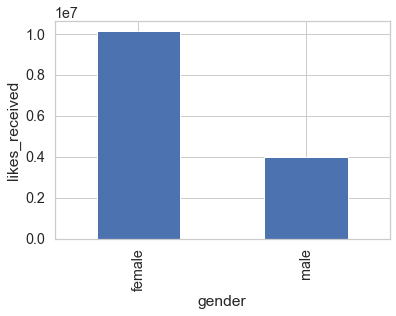

In [30]:
df_fb.groupby(['gender'])['likes_received'].sum().plot(kind='bar')
plt.xlabel('gender')
plt.ylabel('likes_received')

gender
female    251.435435
male       67.911548
Name: likes_received, dtype: float64

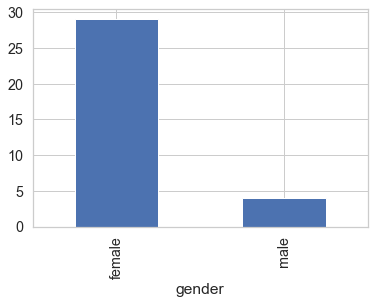

In [22]:
df_fb.groupby(['gender'])['likes_received'].median().plot(kind='bar')
df_fb.groupby(['gender'])['likes_received'].mean()

- **Females** receive **more likes** than **males**. One an **average, a female receives 251 likes compared to 68 likes received by males**

<a id=section50302></a>
### 5.3.2 Which age group receives the highest number of likes?

gender
female    10121282
male       3977851
Name: likes_received, dtype: int64

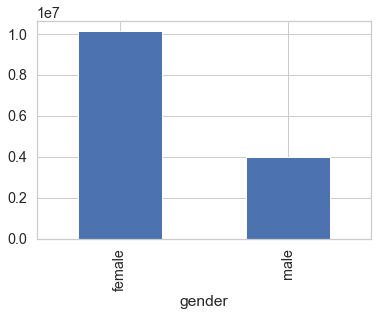

In [39]:
df_fb.groupby(['gender'])['likes_received'].sum().plot(kind='bar')
df_fb.groupby(['gender'])['likes_received'].sum()

<Figure size 1080x504 with 0 Axes>

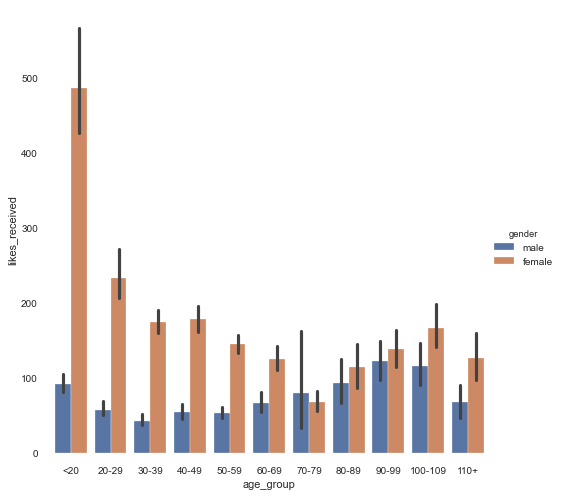

In [22]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='likes_received', hue='gender', data=df_fb, height=7, kind='bar')

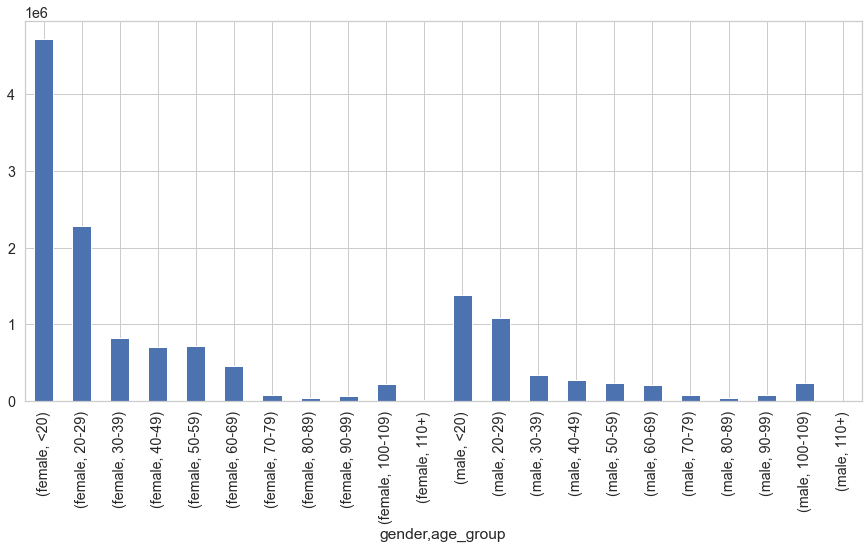

In [44]:
df_fb.groupby(['gender','age_group'])['likes_received'].sum().plot(kind='bar',figsize=(15,7))

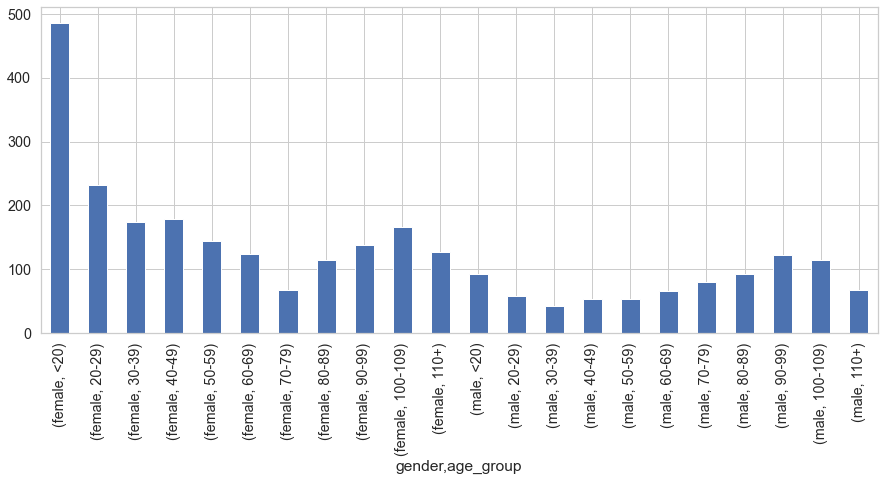

In [62]:
df_fb.groupby(['gender','age_group'])['likes_received'].mean().plot(kind='bar',figsize=(15,6))

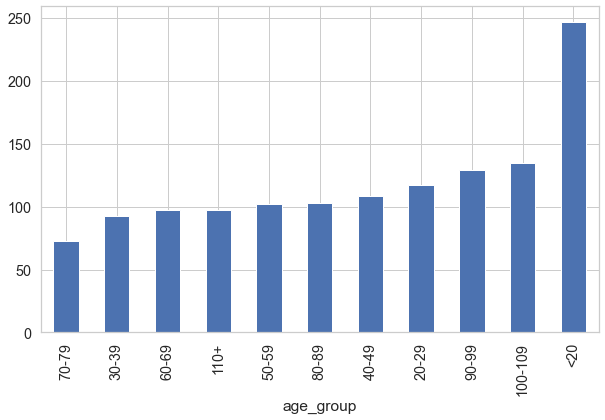

In [32]:
df_fb.groupby(['age_group'])['likes_received'].mean().sort_values().plot(kind='bar',figsize=(10,6))

- The **age group <20** has **the most liked posts** on facebook **on an average**. Moreover, **females aged <20** have the **most liked posts** on facebook and **males aged 30-39** have the **least liked posts** on facebook.

<a id=section50303></a>
### 5.3.3 Which age group gives the most number of likes?

<Figure size 1080x504 with 0 Axes>

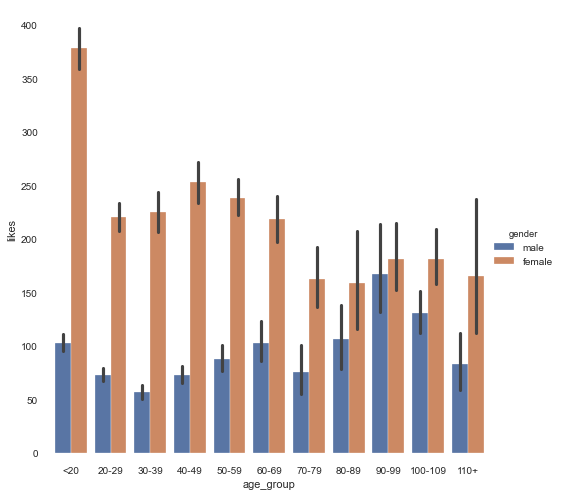

In [25]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='likes', hue='gender', data=df_fb, height=7, kind='bar')

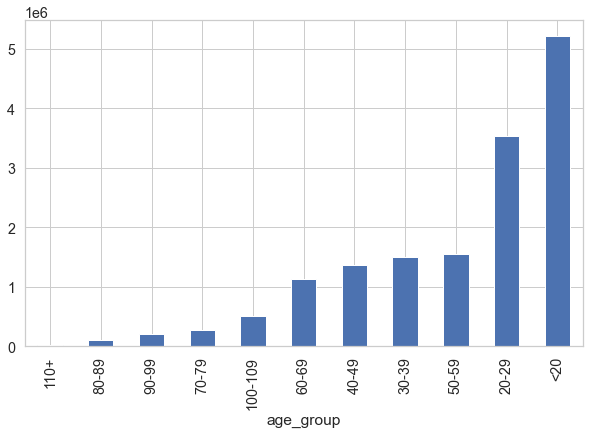

In [21]:
df_fb.groupby(['age_group'])['likes'].sum().sort_values().plot(kind='bar', figsize=(10,6))

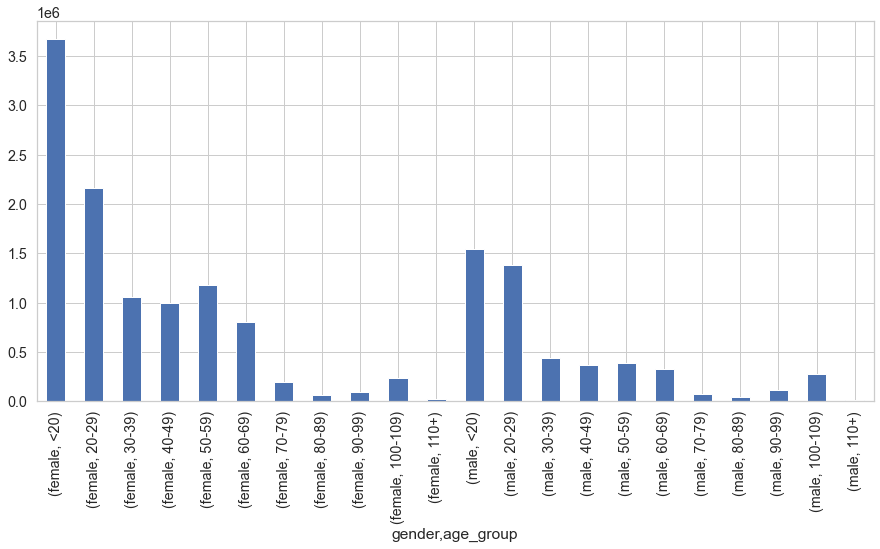

In [45]:
df_fb.groupby(['gender','age_group'])['likes'].sum().plot(kind='bar',figsize=(15,7))

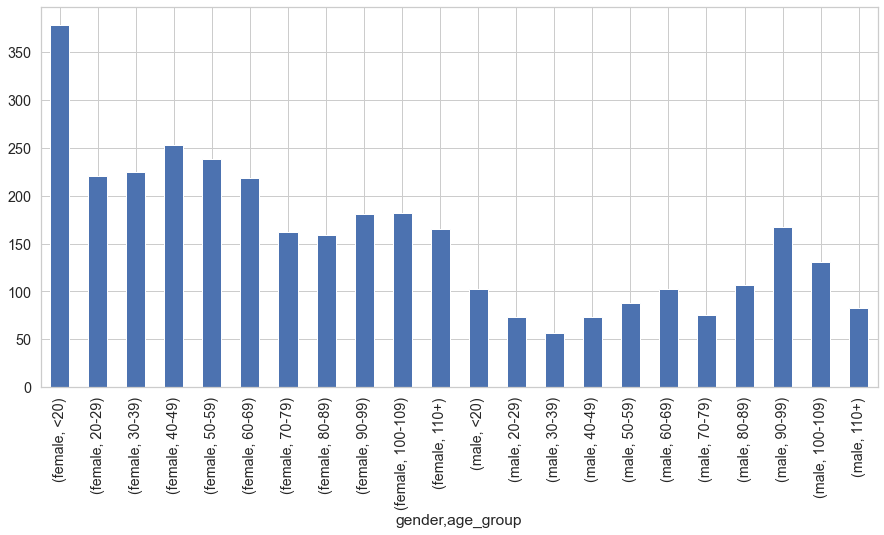

In [65]:
df_fb.groupby(['gender','age_group'])['likes'].mean().plot(kind='bar',figsize=(15,7))

- It can be seen that **females aged <20 like the most posts** on facebook and also **receive the most number of likes**. This implies that **females aged <20** is the **most active facebook user category** in terms of posting and responding to posts.


- **Males aged 30-39 post the least average likes**, implying that this is the **most passive user category in terms of liking posts**.

<a id=section504></a>
## 5.4 Analysis Based on Web and Mobile medium

<a id=section50401></a>
### 5.4.1 Which is the medium of choice for using facebook?

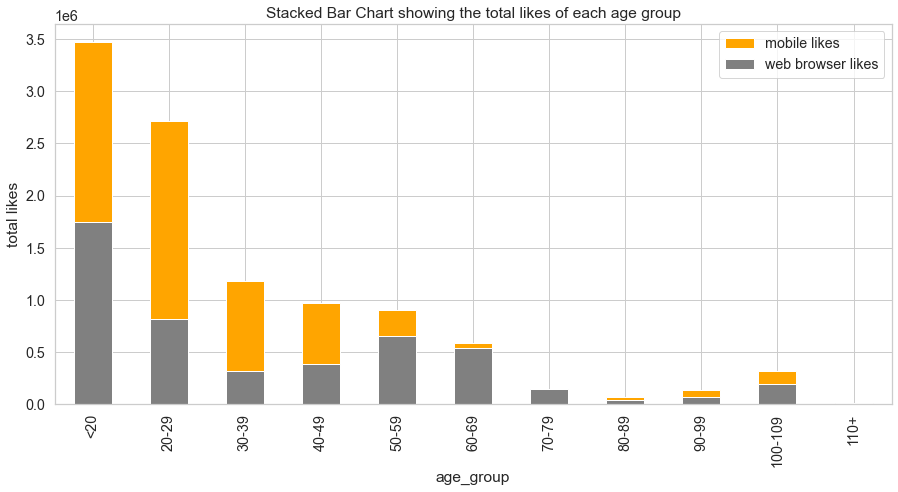

In [12]:
df_fb.groupby(['age_group'])['mobile_likes'].sum().plot(kind='bar', figsize=(15, 7), color='orange')
df_fb.groupby(['age_group'])['www_likes'].sum().plot(kind='bar', figsize=(15, 7), color='grey')

plt.xlabel('age_group')
plt.ylabel('total likes')
plt.title('Stacked Bar Chart showing the total likes of each age group')
plt.legend(labels=('mobile likes', 'web browser likes'))

gender
female    10468106
male       4959923
Name: likes, dtype: int64

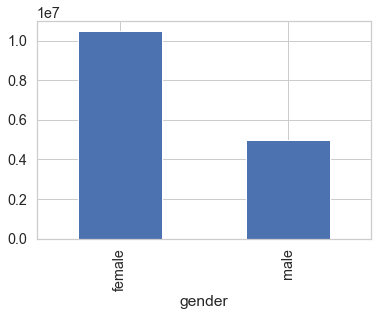

In [38]:
df_fb.groupby(['gender'])['likes'].sum().plot(kind='bar')
df_fb.groupby(['gender'])['likes'].sum()

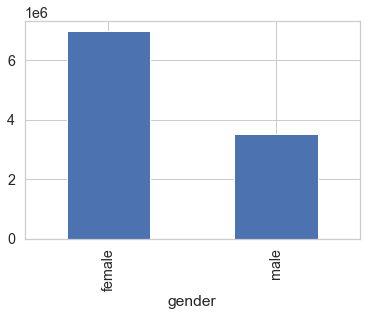

In [16]:
df_fb.groupby(['gender'])['mobile_likes'].sum().plot(kind='bar')

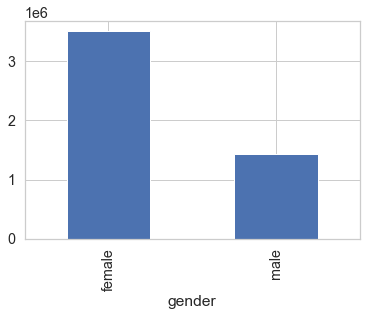

In [17]:
df_fb.groupby(['gender'])['www_likes'].sum().plot(kind='bar')

<Figure size 1080x504 with 0 Axes>

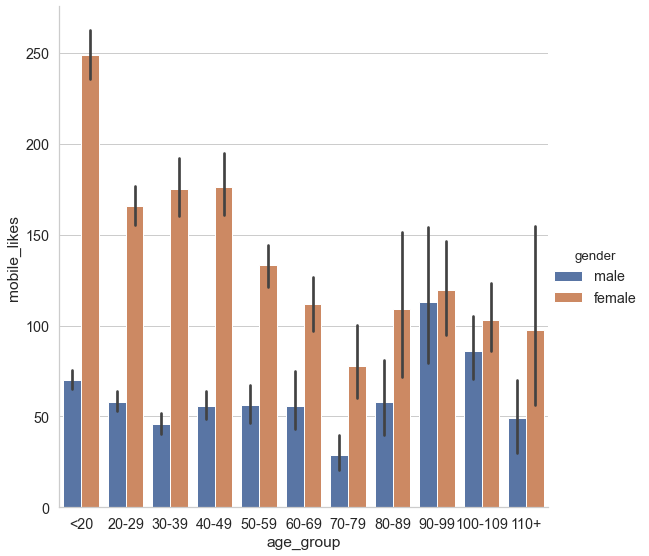

In [19]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='mobile_likes', hue='gender', data=df_fb, height=8, kind='bar')

<Figure size 1080x504 with 0 Axes>

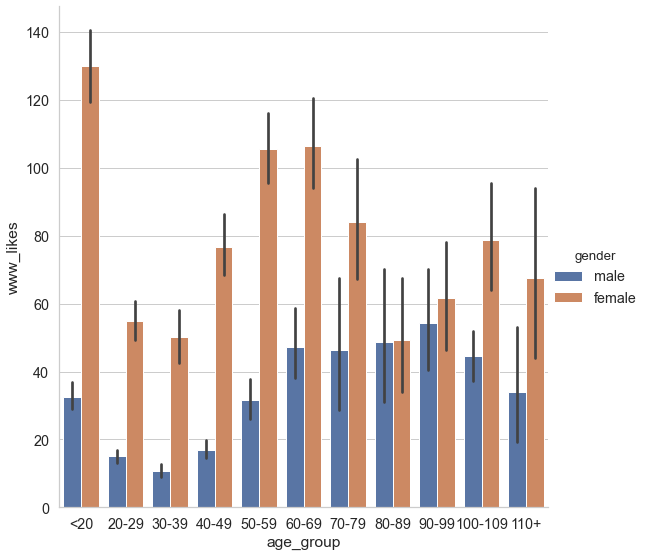

In [20]:
plt.figure(figsize=(15,7))
sns.catplot(x='age_group', y='www_likes', hue='gender', data=df_fb, height=8, kind='bar')

- The **usage of mobile over web for posting likes is higher** for both genders and for all age groups


- This implies that **users are more active over mobile** than web. Also **females use mobile and web versions of facebook more often than males**.

<a id=section50402></a>
### 5.4.2 What is the average tenure based on age?

Text(0, 0.5, 'Average tenure')

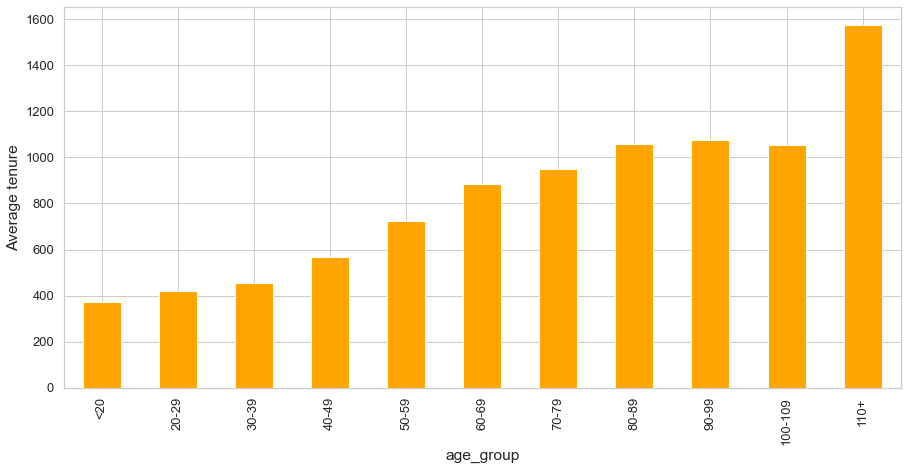

In [33]:
df_fb.groupby(['age_group'])['tenure'].mean().plot(kind='bar',figsize=(15,7), fontsize=13, color='orange')
plt.ylabel('Average tenure')

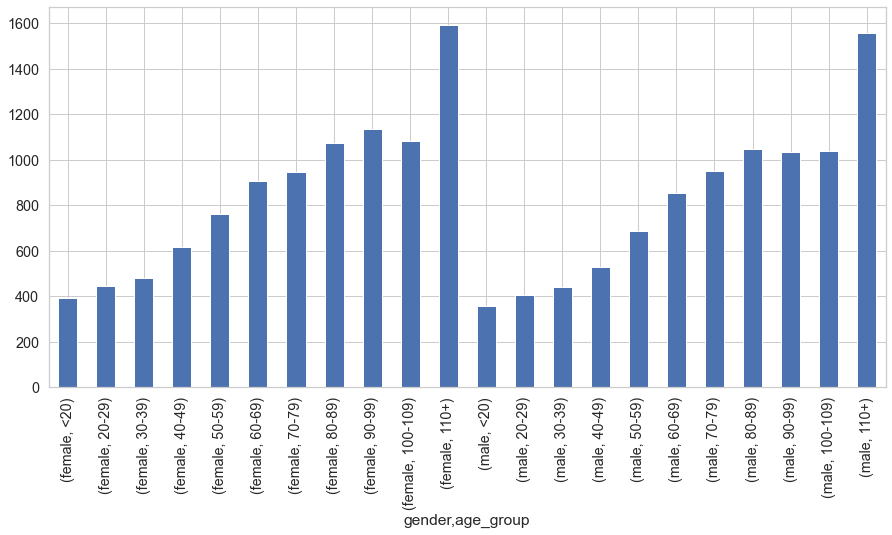

In [50]:
df_fb.groupby(['gender','age_group'])['tenure'].mean().plot(kind='bar',figsize=(15,7))

- Tenure increases with age, indicating that **users stay loyal to facebook after registering the facebook accounts**.

<a id=section506></a>
## 5.5 Comparative analysis

<a id=section50601></a>
### 5.5.1 Comparison of  data between males and females

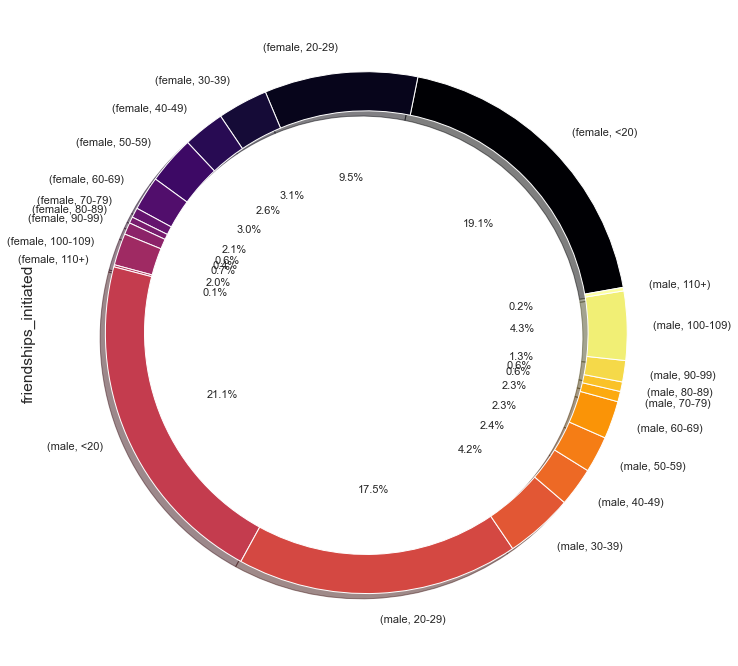

In [12]:
df_fb.groupby(['gender', 'age_group'])['friendships_initiated'].sum().plot(kind='pie', autopct='%3.1f%%', wedgeprops=dict(width=0.15),figsize=(13, 12), fontsize=11, startangle=10, shadow=True, cmap='inferno')

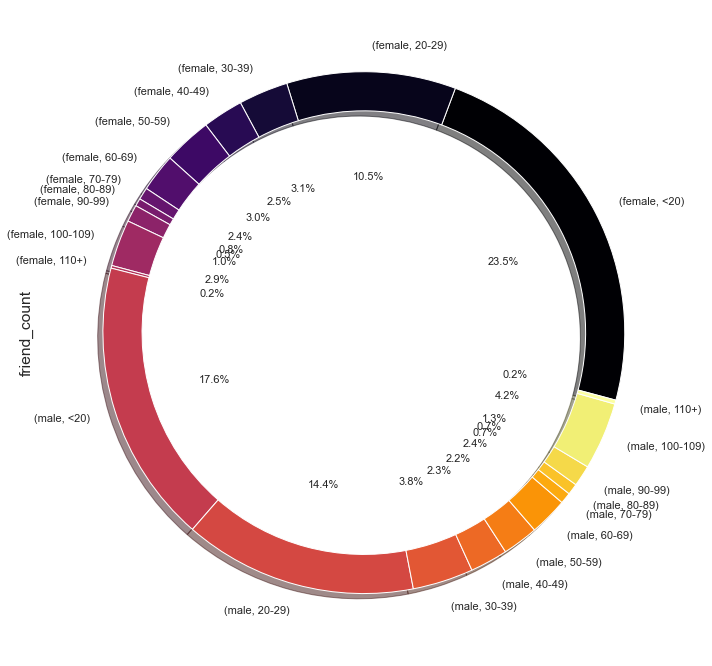

In [67]:
df_fb.groupby(['gender', 'age_group'])['friend_count'].sum().plot(kind='pie', autopct='%3.1f%%', wedgeprops=dict(width=0.15),figsize=(13, 12), fontsize=11, startangle=-15, shadow=True, cmap='inferno')

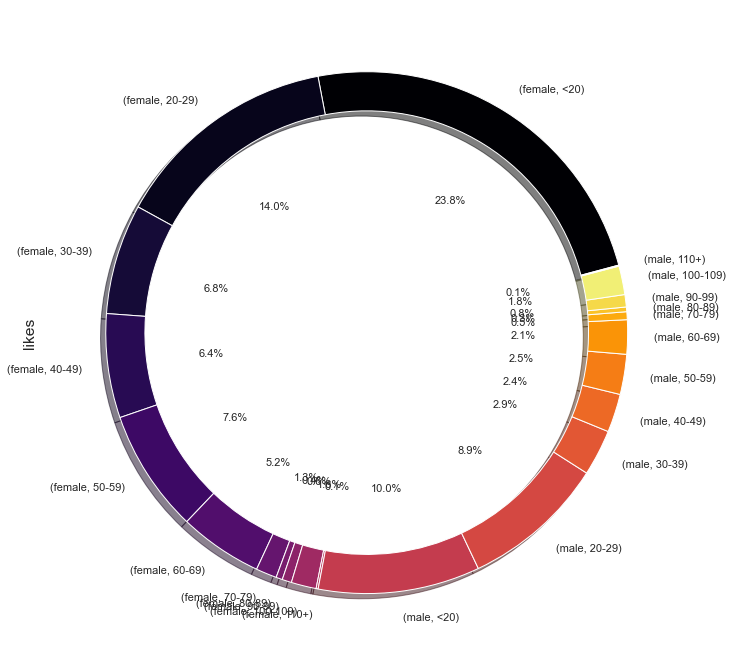

In [19]:
df_fb.groupby(['gender', 'age_group'])['likes'].sum().plot(kind='pie', autopct='%3.1f%%', wedgeprops=dict(width=0.15),figsize=(13, 12), fontsize=11, startangle=15, shadow=True, cmap='inferno')

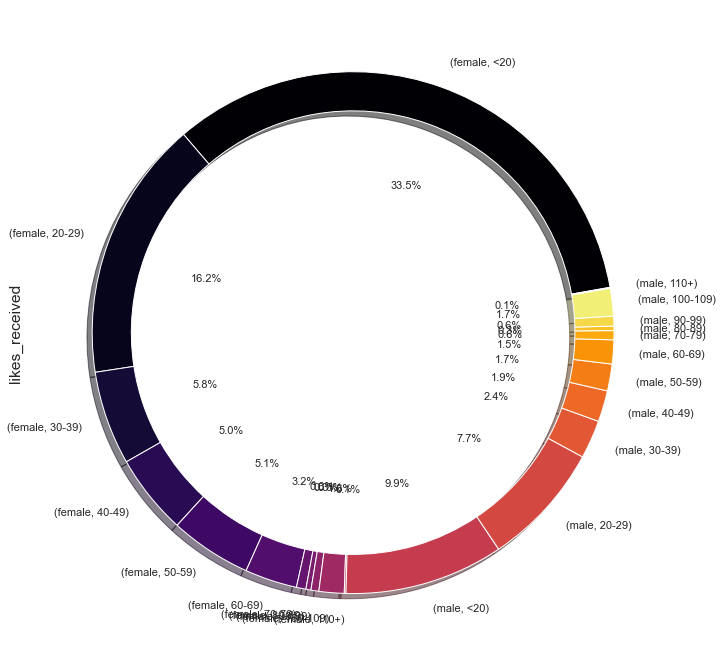

In [20]:
df_fb.groupby(['gender', 'age_group'])['likes_received'].sum().plot(kind='pie', autopct='%3.1f%%', wedgeprops=dict(width=0.15),figsize=(13, 12), fontsize=11, startangle=10, shadow=True, cmap='inferno')

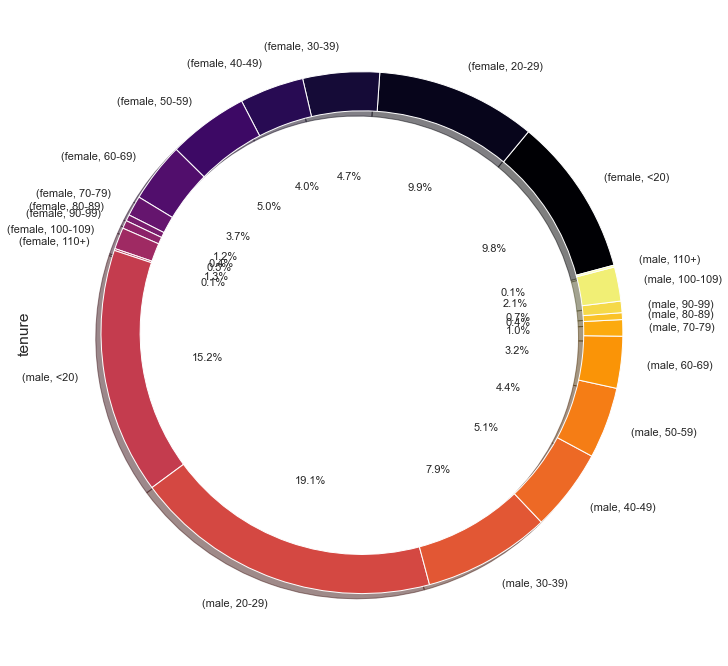

In [20]:
df_fb.groupby(['gender', 'age_group'])['tenure'].count().plot(kind='pie', autopct='%3.1f%%', wedgeprops=dict(width=0.15),figsize=(13, 12), fontsize=11, startangle=15, shadow=True, cmap='inferno')

We could infer the following from pie charts above:

- Females and males aged below 30:

  - socialize more in terms of having friends and initiating friendships. 
  - are popular on facebook in terms of likes generated and likes received

<a id=section6></a>
## 6. Conclusion

- It is analyzed that facebook has users across varied age groups. However, majority of facebook users are below 30 years of age indicating that facebook is more popular with the younger generation. Females and males aged below 30:
  - socialize more in terms of having friends and initiating friendships
  - are poplular on facebook in terms of likes generated and received


- Though male facebook users exceed female facebook users by 18.6%, females have higher number of:
  - facebook friends
  - friendships initited per user
  - likes posted
  - likes received


- Females aged <20 is the most active user category on facebook as they:
  - have the most facebook friends
  - generate and have the most likes received
  

- All age groups generate more likes on mobile than web indicating that facebook mobile is preferred by users over facebook web

<a id=section601></a>
### 6.1 Actionable Insights

- As **male users exceed female users by 18.6%, facebook** can think of ways in which it **can make itself more appealing, user-friendly and convenient to the female gender**


- In order to **increase** the **user base** facebook should **focus on the population above 30 years of age.**


- The usage pattern of females and males differs. Females like more posts and receive more likes for their posts. Facebook should further analyze these behaviours and **understand attributes other than likes information to provide more value add to the male population.**


- **Likes and likes received reduce with increase in age**, implying that the reaction and preception to user posts is dependant on age.**Facebook can customize its offerings based on user age group.**


- There is an **increase in facebook activity in terms of friend count, likes and likes received after 80 years of age. Facebook can think of providing more value added solutions for senior citizens in this age group.**


- As there are **more mobile users than web, facebook should direct its marketing and revenue generating activities more through the mobile application medium.**